# $\Large{\color{darkred}{\textbf{Naive Bayes vs Decision tree}}}$

![WhatsApp Image 2023-12-05 at 16.29.00_1731c34b.jpg](<attachment:WhatsApp Image 2023-12-05 at 16.29.00_1731c34b.jpg>)
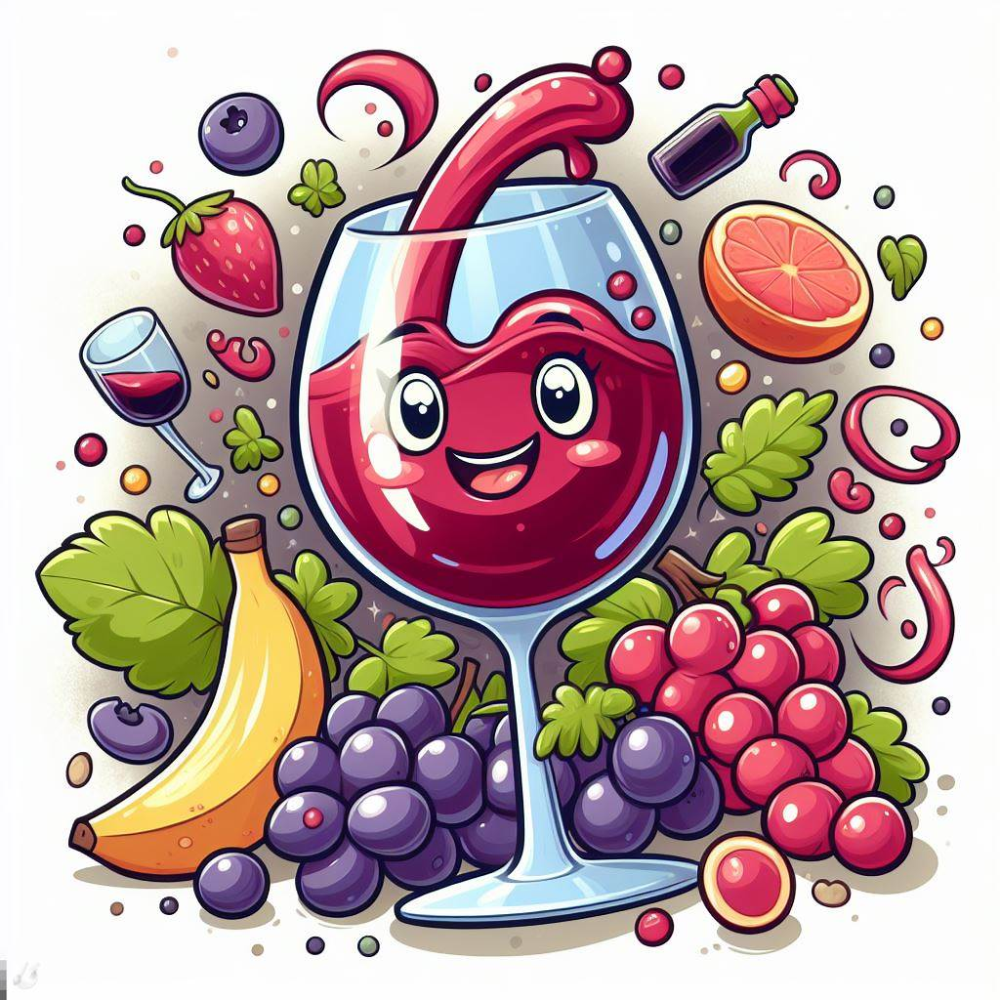

# $\large{\color{darkred}{1.}}$ $\large{\color{darkgreen}{\textbf{Importing Libraries}}}$ $\color{darkred}{✓}$

In [1]:
import pandas as pd
import numpy as np
import seaborn as sbn
import matplotlib.pyplot as plt
from matplotlib.ticker import AutoMinorLocator
from matplotlib.font_manager import FontProperties
import graphviz
import os
from pandas_profiling import ProfileReport

In [2]:
from sklearn.naive_bayes import GaussianNB # continuous variables (Predictor Variables)
from sklearn.tree import DecisionTreeClassifier, export_graphviz

In [3]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.feature_selection import chi2, f_classif
from sklearn.impute import KNNImputer # Missing values

# $\large{\color{darkred}{2.}}$ $\large{\color{darkgreen}{\textbf{Reading the data}}}$ $\color{darkred}{✓}$

In [4]:
Data = pd.read_csv("../input/red-wine-quality-cortez-et-al-2009/winequality-red.csv")
Data_copy = Data.copy()
pd.set_option("display.max_columns", 12)
Data.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


${\color{darkred}{\textbf{"Quality" is an ordinal variable.}}}$ $\color{darkgreen}{✓}$

${\color{darkred}{\textbf{All independent variables are numerical and continuous.}}}$ $\color{darkgreen}{✓}$

# $\large{\color{darkred}{3.}}$ $\large{\color{darkgreen}{\textbf{Data Preprocessing}}}$ $\color{darkred}{✓}$

In [5]:
ProfileReport(Data)

Summarize dataset:   0%|          | 0/25 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
# Quality > 6 ---> Quality = 1 // Quality <= 6 ---> Quality = 0
Data["quality"] = np.where(Data["quality"] > 6, 1, 0)

# ${\color{darkred}{3.1.}}$ ${\color{darkgreen}{\textbf{Missing Values Treatment}}}$  $\color{darkred}{✓}$

In [7]:
Missing_values_percent = 100*(Data.isnull().sum()/len(Data["quality"]))
print(Missing_values_percent)

fixed acidity           0.0
volatile acidity        0.0
citric acid             0.0
residual sugar          0.0
chlorides               0.0
free sulfur dioxide     0.0
total sulfur dioxide    0.0
density                 0.0
pH                      0.0
sulphates               0.0
alcohol                 0.0
quality                 0.0
dtype: float64


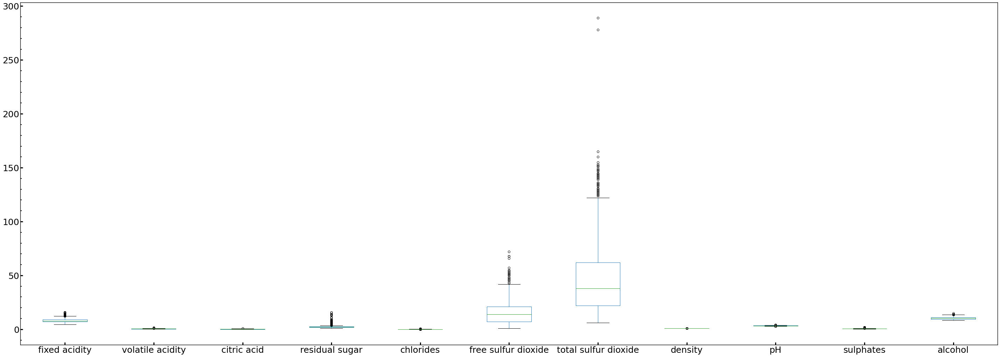

In [8]:
fig, ax = plt.subplots(figsize = (50, 18))
Data.boxplot(column= ["fixed acidity", "volatile acidity", "citric acid", "residual sugar", "chlorides", "free sulfur dioxide", "total sulfur dioxide", "density", "pH", "sulphates", "alcohol"], grid = False)
ax.xaxis.set_minor_locator(AutoMinorLocator())
ax.yaxis.set_minor_locator(AutoMinorLocator())
ax.tick_params(axis = "both", direction = "in", labelcolor='black', labelsize=25, top = False, right = False)
ax.tick_params(which = "major", direction = "in", color='black', length=7, width = 3)
ax.tick_params(which = "minor", direction = "in", color='black', length=4, width = 2, top = False, right = False, bottom = False)
for axis in ["left", "bottom", "right", "top"]:
    ax.spines[axis].set_linewidth(1.4)
plt.show()

# ${\color{darkred}{3.2.}}$ ${\color{darkgreen}{\textbf{Dtypes}}}$  $\color{darkred}{✓}$

In [9]:
Data.dtypes

fixed acidity           float64
volatile acidity        float64
citric acid             float64
residual sugar          float64
chlorides               float64
free sulfur dioxide     float64
total sulfur dioxide    float64
density                 float64
pH                      float64
sulphates               float64
alcohol                 float64
quality                   int64
dtype: object

# ${\color{darkred}{3.3.}}$ ${\color{darkgreen}{\textbf{Analysis}}}$ $\color{darkred}{✓}$

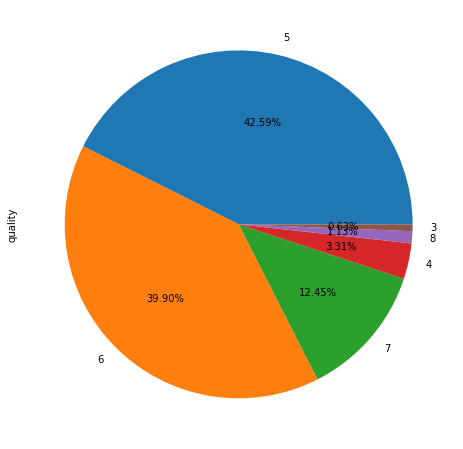

In [10]:
plt.figure(figsize = (8,8))
Data_copy['quality'].value_counts().plot.pie(autopct="%1.2f%%")
plt.show()

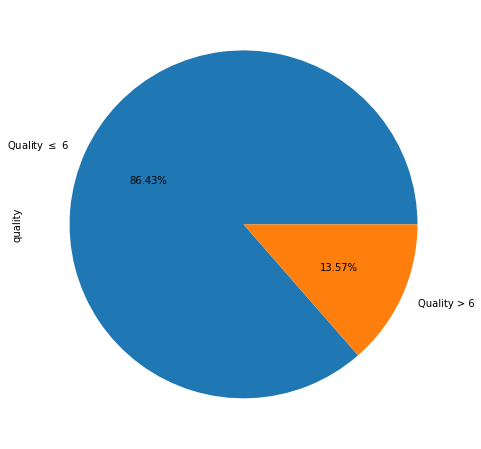

In [11]:
plt.figure(figsize = (8,8))
Data_copy2 = Data.copy()
Data_copy2["quality"] = Data_copy2["quality"].replace({1: "Quality > 6", 0: "Quality $\leq$ 6"})
Data_copy2["quality"].value_counts().plot.pie(autopct="%1.2f%%")
plt.show()

<Figure size 3600x3600 with 0 Axes>

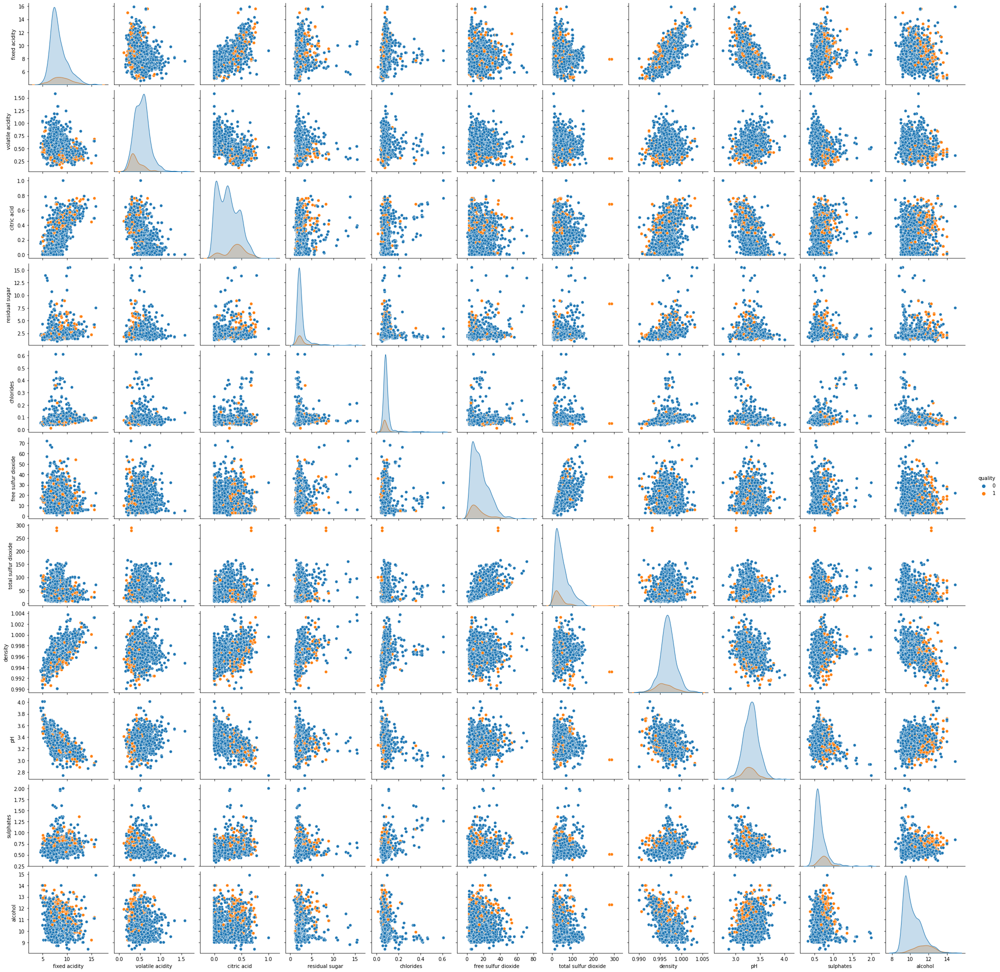

In [12]:
plt.figure(figsize = (50, 50))
sbn.pairplot(Data, hue = "quality")
plt.show()

${\color{darkred}{\textbf{Pearson correlation coefficient}}}$ $\color{darkgreen}{✓}$

$p = \dfrac{Cov(x,y)}{\sigma_{x} \cdot \sigma_{y}}$

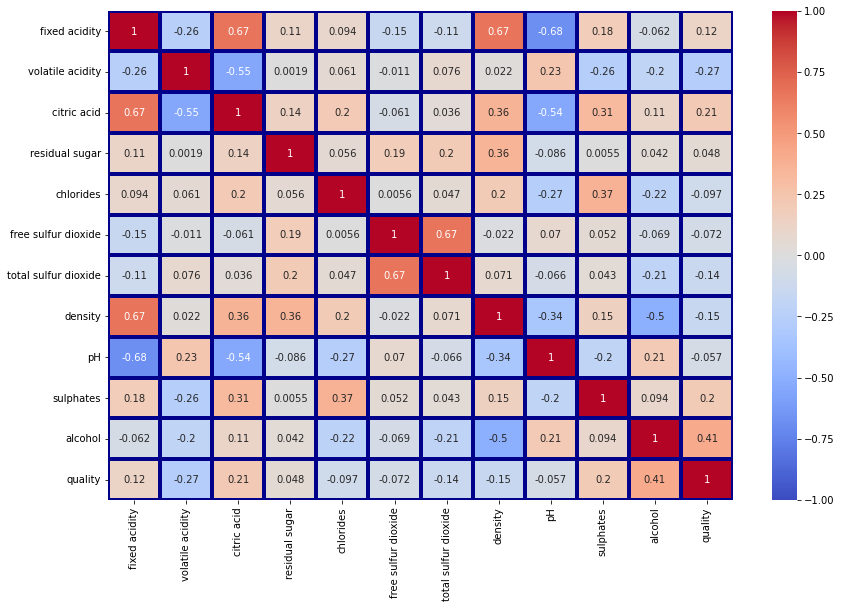

In [13]:
plt.figure(figsize = (14, 9))
sbn.heatmap(Data.corr(), annot = True, vmin = -1, vmax = +1, cmap = "coolwarm",  linewidth = 2.1, linecolor = "darkblue")
plt.show()

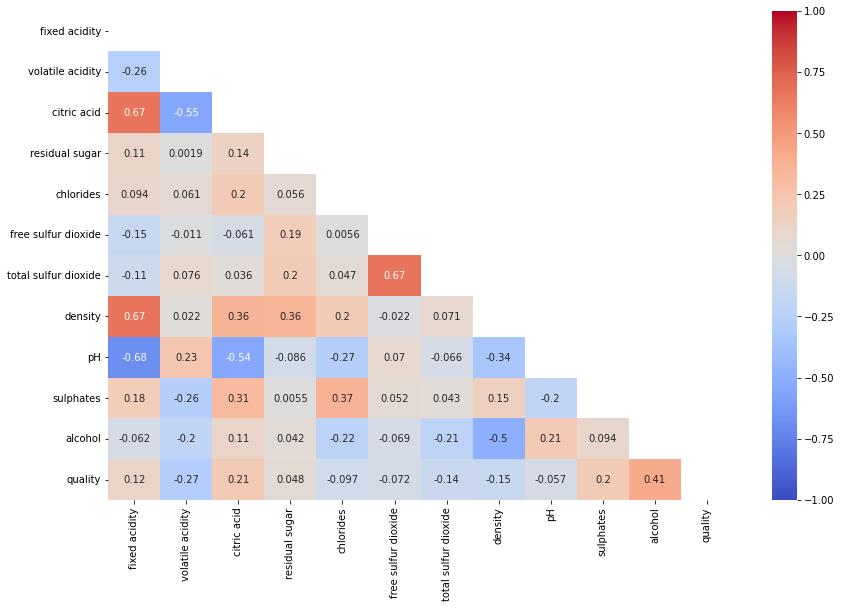

In [14]:
plt.figure(figsize = (14, 9))
triu = np.triu(Data.corr())
sbn.heatmap(Data.corr(), annot = True, vmin = -1, vmax = +1, cmap = "coolwarm", mask = triu)
plt.show()

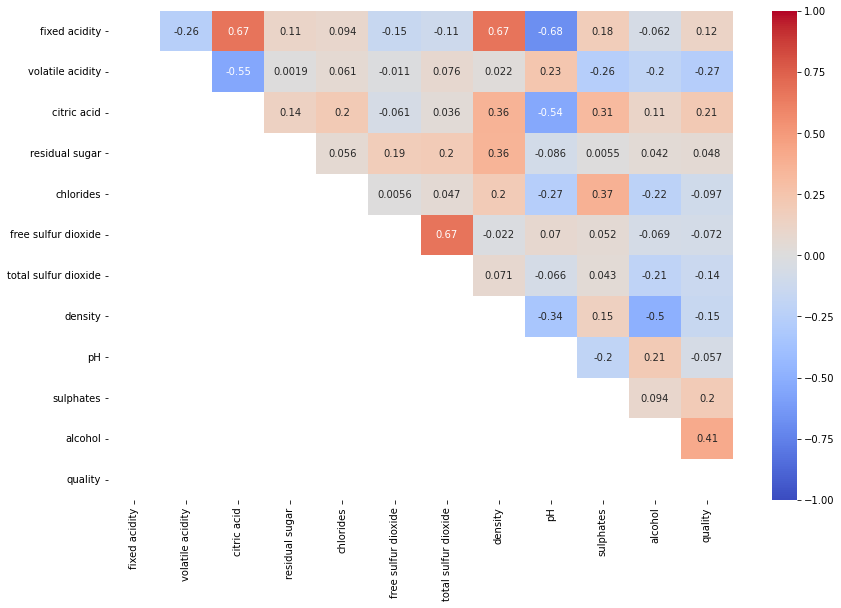

In [15]:
plt.figure(figsize = (14, 9))
tril = np.tril(Data.corr())
sbn.heatmap(Data.corr(), annot = True, vmin = -1, vmax = +1, cmap = "coolwarm", mask = tril)
plt.show()

# ${\color{darkred}{3.4.}}$ ${\color{darkgreen}{\textbf{Data split}}}$ $\color{darkred}{✓}$

In [16]:
x = Data.drop("quality", axis = 1)
y = Data["quality"]
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.33, random_state = 9)

# $\large{\color{darkred}{4.}}$ $\large{\color{darkgreen}{\textbf{Decision Tree}}}$ $\color{darkred}{✓}$

In [17]:
criterion = ["gini", "entropy"]
ModelTree = DecisionTreeClassifier()
max_depth = np.array([2, 3, 4, 5, 6, 7, 8, 9])
min_samples_split = np.array([2, 3, 4, 5, 6, 7, 8, 9])
param_grid = {"criterion": criterion, "max_depth": max_depth, "min_samples_split": min_samples_split}
GridTree = GridSearchCV(estimator = ModelTree, param_grid = param_grid, cv = 5, n_jobs = 3)
GridTree.fit(x_train, y_train)
print(GridTree.best_estimator_.criterion)
print(GridTree.best_estimator_.max_depth)
print(GridTree.best_estimator_.min_samples_split)

gini
6
3


In [18]:
ModelTree = DecisionTreeClassifier(max_depth = 6, min_samples_split=6)
ModelTree.fit(x_train, y_train)

DecisionTreeClassifier(max_depth=6, min_samples_split=6)

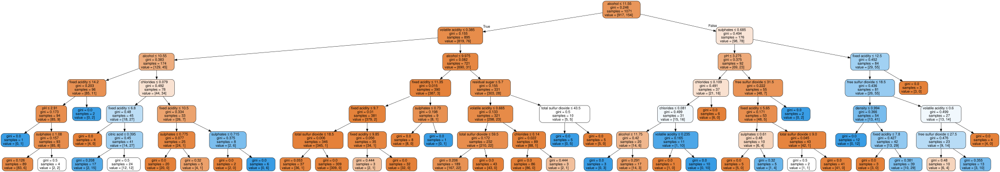

In [19]:
Data_dot = export_graphviz(ModelTree, out_file = None, feature_names = list(x_train.columns), filled = True,
               rounded = True, special_characters = True, leaves_parallel = False, rotate = False)
graphviz.Source(Data_dot)

In [20]:
y_predTree = ModelTree.predict(x_test)

In [21]:
MatrixTree = confusion_matrix(y_test, y_predTree)

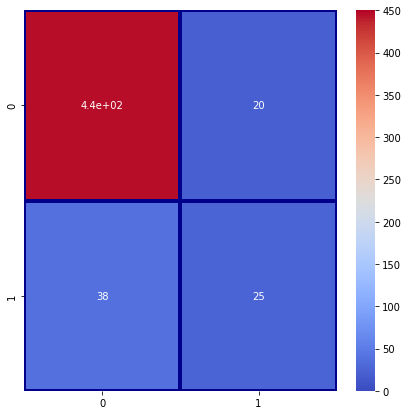

In [22]:
plt.figure(figsize = (7, 7))
sbn.heatmap(MatrixTree, annot = True, vmin = 0, vmax = 450, cmap = "coolwarm",  linewidth = 2.1, linecolor = "darkblue")
plt.show()

In [23]:
print(f"Accuracy: {accuracy_score(y_test, y_predTree)}")
print(f"Recall: {recall_score(y_test, y_predTree)}")
print(f"Precision: {precision_score(y_test, y_predTree)}")
print(f"f1_score: {f1_score(y_test, y_predTree)}")

Accuracy: 0.8901515151515151
Recall: 0.3968253968253968
Precision: 0.5555555555555556
f1_score: 0.46296296296296297


# $\large{\color{darkred}{5.}}$ $\large{\color{darkgreen}{\textbf{Naive Bayes}}}$ $\color{darkred}{✓}$

In [24]:
ModelNB = GaussianNB()
ModelNB.fit(x_train, y_train)

GaussianNB()

In [25]:
y_predNB = ModelNB.predict(x_test)

In [26]:
MatrixNB = confusion_matrix(y_test, y_predNB)

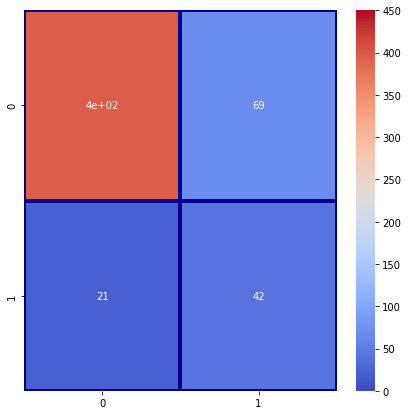

In [27]:
plt.figure(figsize = (7, 7))
sbn.heatmap(MatrixNB, annot = True, vmin = 0, vmax = 450, cmap = "coolwarm",  linewidth = 2.1, linecolor = "darkblue")
plt.show()

In [28]:
print(f"Accuracy: {accuracy_score(y_test, y_predNB)}")
print(f"Recall: {recall_score(y_test, y_predNB)}")
print(f"Precision: {precision_score(y_test, y_predNB)}")
print(f"f1_score: {f1_score(y_test, y_predNB)}")

Accuracy: 0.8295454545454546
Recall: 0.6666666666666666
Precision: 0.3783783783783784
f1_score: 0.48275862068965514
